In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
from sklearn import preprocessing
from keras.layers import Input, Dense
from keras.models import Model
import sys
# src folder
sys.path.insert(0, "../")
# autoencoders lib
from autoencoders import get_simple_autoencoder, get_autoencoder, decode
from utils import lift_summary

Using TensorFlow backend.


## Read data

In [2]:
# The used dataset is available in https://www.kaggle.com/mlg-ulb/creditcardfraud
df = pd.read_csv("../../data/creditcard.csv")
# Show Nb rows, Nb cols
df.shape

(284807, 31)

In [3]:
# Show header
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


## Exploratory analysis

In [4]:
# Review target columns - we only have 492 true observations out of almost 285K
# That means that we have a 0.17% of fraud rate in the dataset
df.Class.value_counts()

0    284315
1       492
Name: Class, dtype: int64

In [5]:
# NA check - not a single NA in any column
# No need to handle NA
df.isna().sum().any()

False

In [6]:
# We will not do a time-dynamic analysis, so the Time columns will be dropped
df = df.drop(columns=['Time'])

### Univariate analysis

/home/sgamez/anaconda3/envs/kerasenv/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


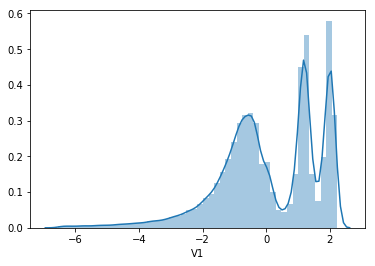

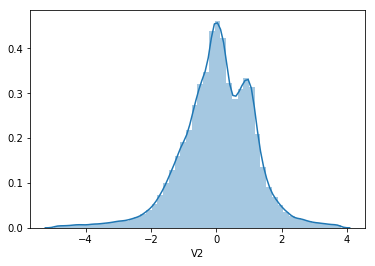

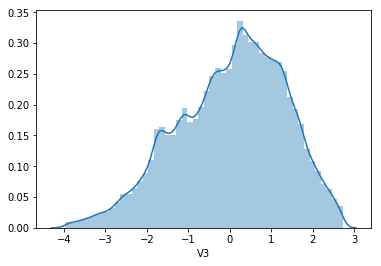

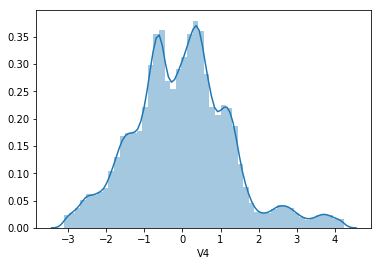

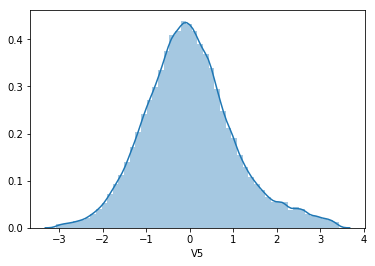

...

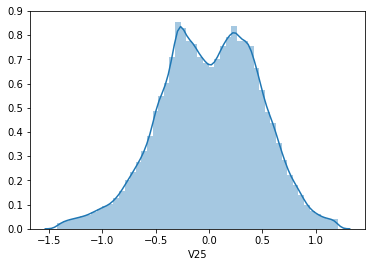

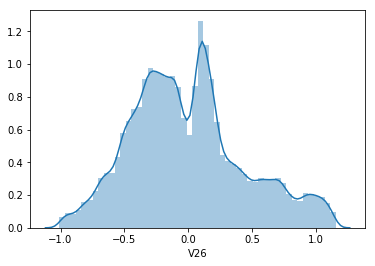

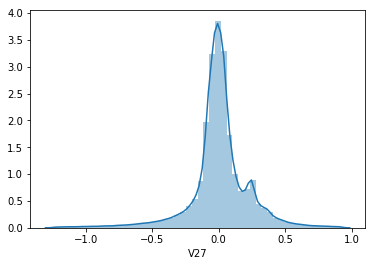

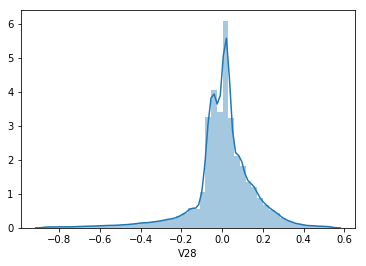

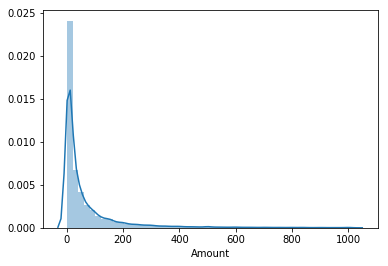

In [7]:
# Capture the target column and the features
target_col = 'Class'
features = [c for c in df.columns if c!= target_col]
# Outlier removal treshold
TH_outliers = 0.01
for feat in features:
    #drop top / bottom x% to remove outliers
    perc_cuts = df[feat].quantile(q=[TH_outliers, 1. - TH_outliers])
    feat_series = df[df[feat].between(*perc_cuts)][feat]
    sns.distplot(feat_series)
    plt.show()

### Bivariate analysis

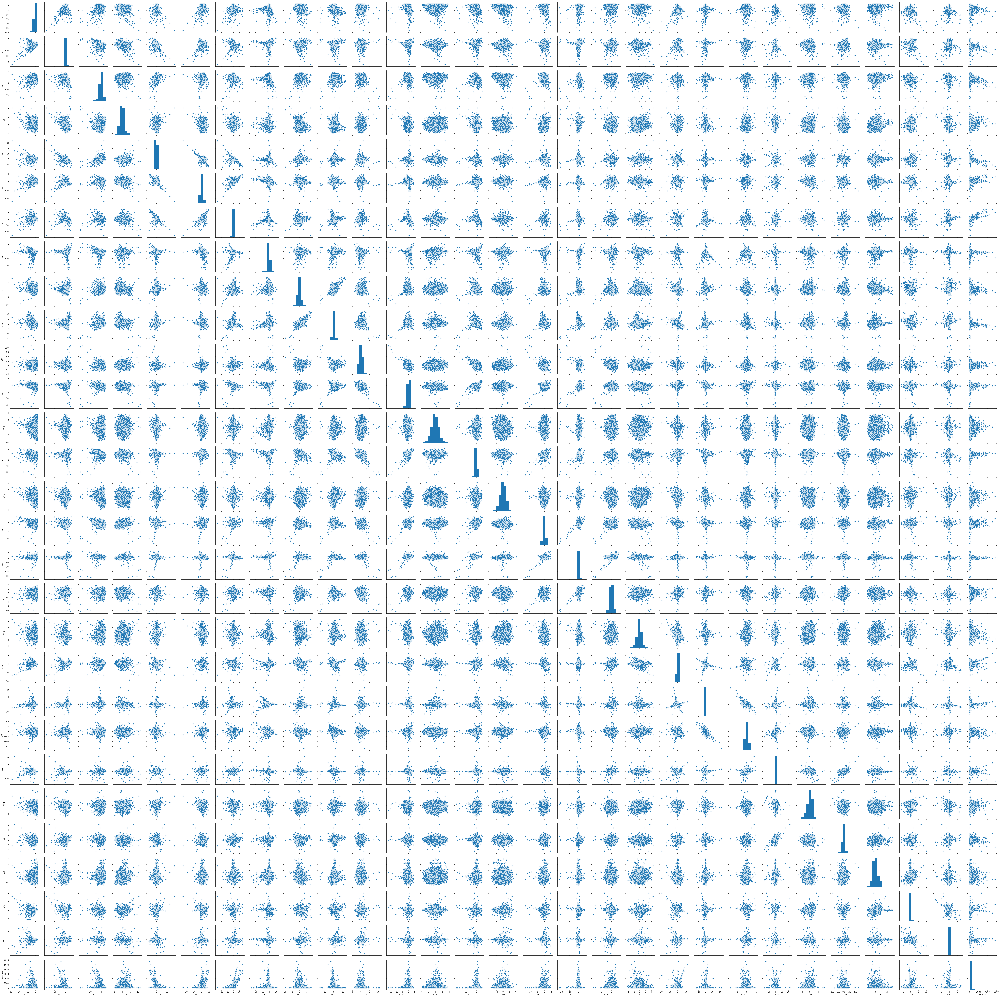

In [8]:
# Using a sample because otherwise it takes forever
sns.pairplot(df[features].sample(frac=0.05))

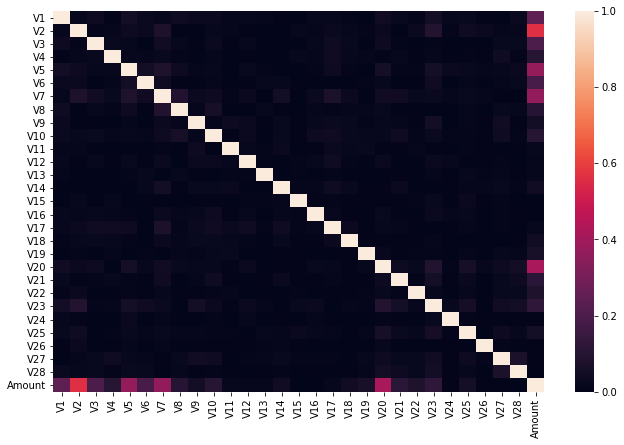

In [9]:
# Correlation plot
corr = df[features].sample(frac=0.05).corr()
plt.figure(figsize=(11, 7))
sns.heatmap(corr.abs(),
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values,
            vmin=0.,
            vmax=1)

### Data distribution vs target feature

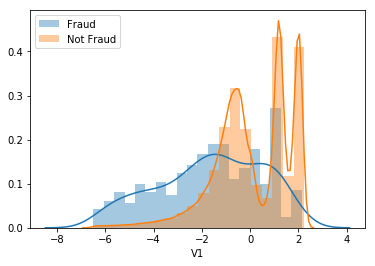

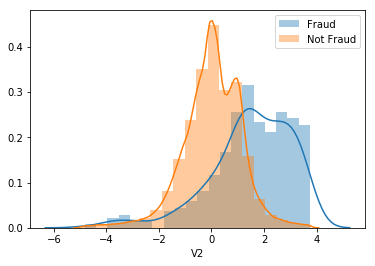

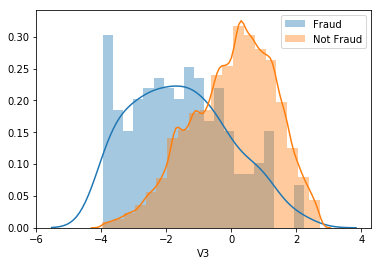

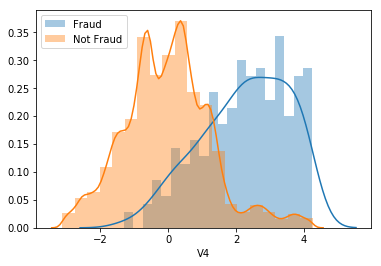

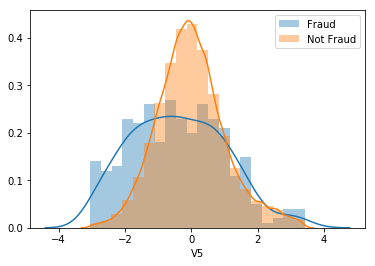

...

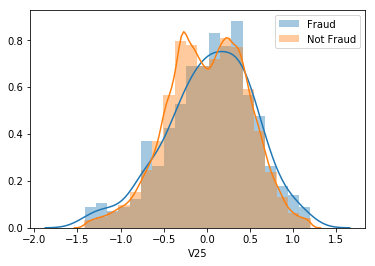

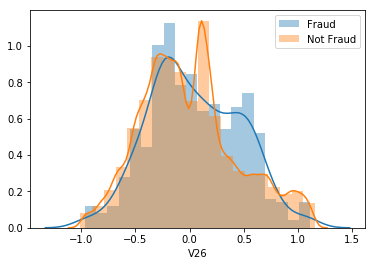

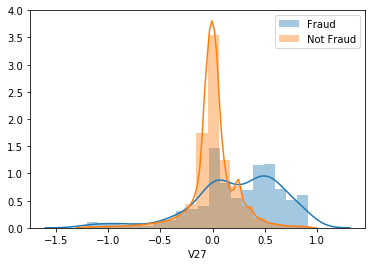

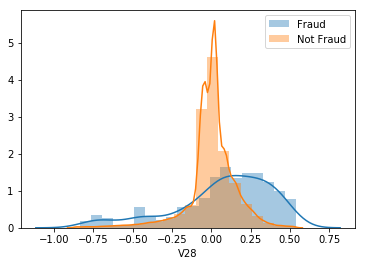

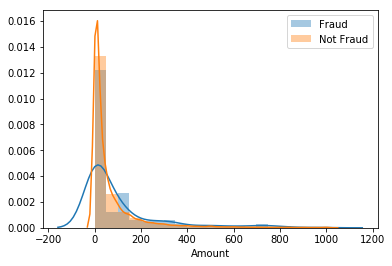

In [10]:
for feat in features:
    # drop top / bottom x% to remove outliers
    perc_cuts = df[feat].quantile(q=[TH_outliers, 1. - TH_outliers])
    df_cut = df[df[feat].between(*perc_cuts)]
    # capture fraud and not fraud entries
    series_fraud = df_cut.loc[df_cut.Class == 1][feat]
    series_nfraud = df_cut.loc[df_cut.Class == 0][feat]
    sns.distplot(series_fraud, bins=20, label='Fraud')
    sns.distplot(series_nfraud, bins=20, label='Not Fraud')
    plt.legend()
    plt.show()

## Autoencoder modelling

### Data Preparation

In [11]:
# Set the compresion factor
COMP_FACTOR = 2
# Get the data columns out of the dataframe
X_base = df[features]
# Train test split
X_train, X_test, y_train, y_test = train_test_split(X_base, df.Class, test_size=0.2)
X_base.shape, X_train.shape, X_test.shape

((284807, 29), (227845, 29), (56962, 29))

In [12]:
# Data preprocessing 
# Use StandardScaler in order to set mean to 0 and have unit variance
scaler = preprocessing.StandardScaler().fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

### Autoencoders initialization

In [13]:
smp_autoencoder, smp_encoder, smp_decoder = get_simple_autoencoder(X_train, COMP_FACTOR)
smp_autoencoder.compile(optimizer='adadelta', loss='binary_crossentropy')
smp_autoencoder.fit(X_train, X_train,
                    epochs=50,
                    batch_size=128,
                    shuffle=True,
                    validation_data=(X_test, X_test))

Train on 227845 samples, validate on 56962 samples
Epoch 1/50
227845/227845 [==============================] - 3s 15us/step - loss: -2.5875 - val_loss: -3.9752
Epoch 2/50
227845/227845 [==============================] - 3s 12us/step - loss: -4.1873 - val_loss: -4.3307
Epoch 3/50
227845/227845 [==============================] - 3s 12us/step - loss: -4.4307 - val_loss: -4.5069
Epoch 4/50
227845/227845 [==============================] - 3s 12us/step - loss: -4.5806 - val_loss: -4.6227
Epoch 5/50
227845/227845 [==============================] - 3s 12us/step - loss: -4.6763 - val_loss: -4.6985
Epoch 6/50
227845/227845 [==============================] - 3s 12us/step - loss: -4.7428 - val_loss: -4.7556
Epoch 7/50
227845/227845 [==============================] - 3s 12us/step - loss: -4.7923 - val_loss: -4.8011
Epoch 8/50
227845/227845 [==============================] - 3s 12us/step - loss: -4.8339 - val_loss: -4.8394
Epoch 9/50
227845/227845 [==============================] - 3s 12us/step - lo

In [14]:
autoencoder, encoder, decoder = get_autoencoder(X_train, COMP_FACTOR)
autoencoder.compile(optimizer='adadelta', loss='binary_crossentropy')
autoencoder.fit(X_train, X_train,
                epochs=30,
                batch_size=128,
                shuffle=True,
                validation_data=(X_test, X_test))

Train on 227845 samples, validate on 56962 samples
Epoch 1/30
227845/227845 [==============================] - 4s 17us/step - loss: -2.9372 - val_loss: -3.8459
Epoch 2/30
227845/227845 [==============================] - 3s 15us/step - loss: -4.1343 - val_loss: -4.3249
Epoch 3/30
227845/227845 [==============================] - 3s 15us/step - loss: -4.4808 - val_loss: -4.5403
Epoch 4/30
227845/227845 [==============================] - 3s 15us/step - loss: -4.7171 - val_loss: -4.7387
Epoch 5/30
227845/227845 [==============================] - 3s 15us/step - loss: -4.8527 - val_loss: -4.8237
Epoch 6/30
227845/227845 [==============================] - 3s 15us/step - loss: -4.9133 - val_loss: -4.8692
Epoch 7/30
227845/227845 [==============================] - 3s 15us/step - loss: -4.9537 - val_loss: -4.8820
Epoch 8/30
227845/227845 [==============================] - 3s 15us/step - loss: -4.9952 - val_loss: -4.9388
Epoch 9/30
227845/227845 [==============================] - 3s 15us/step - lo

In [15]:
dec_tr_smp = decode(X_train, smp_encoder, smp_decoder)
dec_test_smp = decode(X_test, smp_encoder, smp_decoder)

dec_tr = decode(X_train, encoder, decoder)
dec_test = decode(X_test, encoder, decoder)

In [17]:
dist_tr_smp = np.apply_along_axis(np.linalg.norm, axis=1, arr=(X_train - dec_tr_smp))
dist_test_smp = np.apply_along_axis(np.linalg.norm, axis=1, arr=(X_test - dec_test_smp))

dist_tr = np.apply_along_axis(np.linalg.norm, axis=1, arr=(X_train - dec_tr))
dist_test = np.apply_along_axis(np.linalg.norm, axis=1, arr=(X_test - dec_test))

## Evaluation

### Lift evaluation

In [18]:
df_ev_train_smp = pd.DataFrame({'class': y_train,
                            'dist': dist_tr_smp})
df_ev_test_smp = pd.DataFrame({'class': y_test,
                           'dist': dist_test_smp})

df_ev_train = pd.DataFrame({'class': y_train,
                            'dist': dist_tr})
df_ev_test = pd.DataFrame({'class': y_test,
                           'dist': dist_test})

In [19]:
lift_summary(df_ev_train_smp)

,Pcts,Nb,Cum_sum,Lift
0,1.0,2279,233,61.953130
1,5.0,9114,322,5.917423
2,10.0,11392,336,0.744697
3,20.0,22784,343,0.186174
4,100.0,182275,376,0.109708


In [20]:
lift_summary(df_ev_test_smp)

,Pcts,Nb,Cum_sum,Lift
0,1.0,570,72,62.027586
1,5.0,2279,106,7.325914
2,10.0,2848,107,0.172420
3,20.0,5696,111,0.344840
4,100.0,45568,116,0.053881


In [21]:
lift_summary(df_ev_train)

,Pcts,Nb,Cum_sum,Lift
0,1.0,2279,233,61.953130
1,5.0,9114,323,5.983911
2,10.0,11392,336,0.691505
3,20.0,22784,347,0.292560
4,100.0,182275,376,0.096410


In [22]:
lift_summary(df_ev_test)

,Pcts,Nb,Cum_sum,Lift
0,1.0,570,71,61.166092
1,5.0,2279,106,7.541382
2,10.0,2848,108,0.344840
3,20.0,5696,111,0.258630
4,100.0,45568,116,0.053881


The base setting generates a significant lift, with a lift of almost 60 at top 1% in the test set.

### AUC

In [26]:
roc_auc_score(y_train, dist_tr_smp)

0.9482982156184387

In [27]:
roc_auc_score(y_test, dist_test_smp)

0.9640303142064404

In [28]:
roc_auc_score(y_train, dist_tr)

0.9484142473283477

In [29]:
roc_auc_score(y_test, dist_test)

0.9653696860361994